# **Import the packages and the files**

In [2]:
import pandas as pd
import numpy as np
from google.colab import files

# text preprocessing
import nltk
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import CountVectorizer

 
# feature extraction / vectorization
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# classifiers and data shufling 
from sklearn.linear_model import LogisticRegression 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedShuffleSplit

# plots and metrics
from sklearn.metrics import accuracy_score ,confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud


In [3]:
files.upload()

Saving Data_internship_test_anonymized.xlsx to Data_internship_test_anonymized.xlsx


{'Data_internship_test_anonymized.xlsx': b'PK\x03\x04\x14\x00\x06\x00\x08\x00\x00\x00!\x00A7\x82\xcfn\x01\x00\x00\x04\x05\x00\x00\x13\x00\x08\x02[Content_Types].xml \xa2\x04\x02(\xa0\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

In [4]:
files.upload()

Saving Data_to_project.xlsx to Data_to_project.xlsx


{'Data_to_project.xlsx': b'PK\x03\x04\x14\x00\x06\x00\x08\x00\x00\x00!\x00b\xee\x9dh^\x01\x00\x00\x90\x04\x00\x00\x13\x00\x08\x02[Content_Types].xml \xa2\x04\x02(\xa0\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

In [5]:
df_project = pd.read_excel('Data_to_project.xlsx')

# **1)- Data to project**

```



## **Data Cleaning :**
 our data contains a lot of noise either in the form of symbols or in the form of punctuations and stopwords. Therefore, it becomes necessary to clean the text, not just for making it more understandable but also for getting better insights. 
 I will perform text cleaning on the columns containing textual data.

Here, we have four columns in our dataset out of which one column (‘Sound Bite Text’) contain textual data. the others are not nessicery so i will delete them.

 Let’s see if there are any null values present in our dataset :

In [6]:
df_project.isnull().sum()

SIA_ID                                 0
Sound Bite Text                        0
Source Type                            0
Published Date (GMT-05:00) New York    0
dtype: int64

In [7]:
df_project.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15837 entries, 0 to 15836
Data columns (total 4 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   SIA_ID                               15837 non-null  int64 
 1   Sound Bite Text                      15837 non-null  object
 2   Source Type                          15837 non-null  object
 3   Published Date (GMT-05:00) New York  15837 non-null  object
dtypes: int64(1), object(3)
memory usage: 495.0+ KB


In [8]:
df_project.head()

,SIA_ID,Sound Bite Text,Source Type,Published Date (GMT-05:00) New York
0,184435,@highiqhaver @nutsoutatdennys @joshuaRohnerd @...,Twitter,1/10/2020 13:33
1,184426,i will never be intimidated by a bitch that pr...,Twitter,1/10/2020 10:35
2,184460,two of my coworkers said dasani doesnt taste ...,Twitter,1/10/2020 18:29
3,184469,@BaddGalJT Its nasty thats why! Im bout to ...,Twitter,1/10/2020 21:35
4,184476,@ernstoTV Right easy. Dasani taste like shit,Twitter,1/10/2020 23:00


In [9]:
df_project.drop(['SIA_ID', 'Published Date (GMT-05:00) New York', 'Source Type'], axis =1, inplace= True)

In [10]:
df_project.rename(columns = {'Sound Bite Text':'Text'}, inplace = True)


In [11]:
df_project.head()

,Text
0,@highiqhaver @nutsoutatdennys @joshuaRohnerd @...
1,i will never be intimidated by a bitch that pr...
2,two of my coworkers said dasani doesnt taste ...
3,@BaddGalJT Its nasty thats why! Im bout to ...
4,@ernstoTV Right easy. Dasani taste like shit


In [12]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [13]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [14]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

**Let's clean our text by using regular expressions and limmetaizing the words of the sentences :**

In [15]:
lemmatizer = WordNetLemmatizer()
corpus1 = []
for i in range(0, len(df_project)):
        review1 = re.sub('[^a-zA-Z]', ' ', df_project['Text'][i])
        review1 = review1.lower()
        review1 = review1.split()
        
        review1 = [lemmatizer.lemmatize(word) for word in review1 if not word in stopwords.words('english')]
        review1 = ' '.join(review1)
        corpus1.append(review1)

In [16]:
corpus1

['highiqhaver nutsoutatdennys joshuarohnerd b oodrush saintshithead apple rogue dasani bottle thanks gave follow',
 'never intimidated bitch prefers drink dasani aquafina enjoy ur toilet water b',
 'two coworkers said dasani taste bad think hire ppl w taste',
 'baddgaljt nasty bout get cocky hell hate aquafina dasani bunch one',
 'ernstotv right easy dasani taste like shit',
 'ernstotv yo everyone hatin dasani dasani hitting different',
 'emfles dasani worst case',
 'dasani bottle really enjoy good call',
 'dasani water really best water argue',
 'ph drinking water approximately blood anything acidic hurting throat water like dasani actually garbage buy dasani basically uncarbonated coke water way acidic water like arrowhead voss smart water nice soothing ph tap water usually treated chemical affect ph hurt throat best option say look tap water filter amazon getting ph water machine let get really good tasting water cheaper long run constantly buying environment destroying plastic bott

In [17]:
df_project['Text'] = pd.DataFrame(corpus1)

In [18]:
df_project

,Text
0,highiqhaver nutsoutatdennys joshuarohnerd b oo...
1,never intimidated bitch prefers drink dasani a...
2,two coworkers said dasani taste bad think hire...
3,baddgaljt nasty bout get cocky hell hate aquaf...
4,ernstotv right easy dasani taste like shit
...,...
15832,drink dasani giving cookout
15833,cope harder taste good
15834,greg abbott definitely drink dasani water pic ...
15835,nigga said dasani water good red flag


## **Exploratory Data Analysis (EDA)**

### **Text length**

**The length of the samples in the dataset is very important, as it can affect how you represent your text as features for the ML models. For example, TF-IDF is usually too sparse for short texts and average Word2Vec is usually too noisy for long texts.**

count    15837.000000
mean         9.204079
std          9.079497
min          2.000000
25%          5.000000
50%          7.000000
75%         10.000000
max        114.000000
Name: Text, dtype: float64


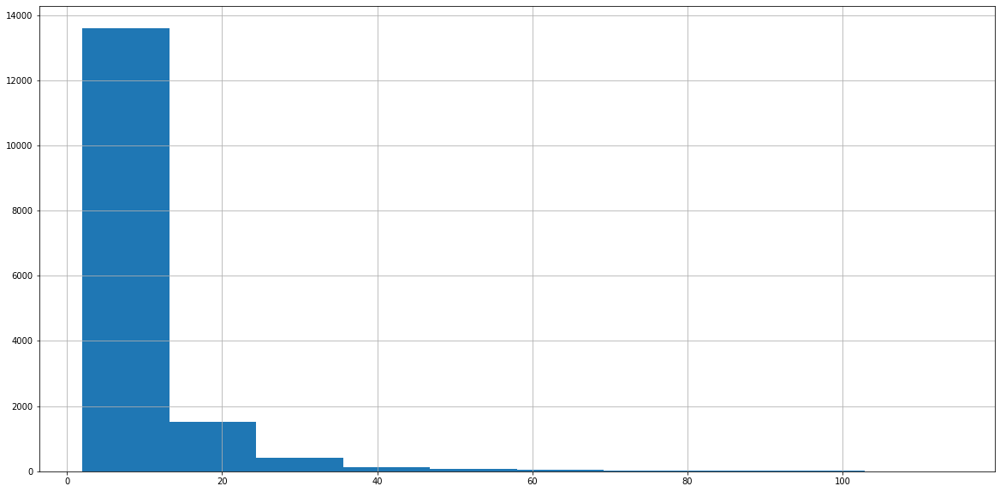

In [19]:
lens = df_project['Text'].str.split().apply(lambda x: len(x))
print(lens.describe())
plt.rcParams['figure.figsize'] = [20, 10]
lens.hist()

**Results of this calculation establish that sentences length is short (average length of 9 words). And 75 % of sentences length is less than 10 words .**



### **Term frequencies**

**In this step, I find the most frequent words in the data, extracting information about its content .**

In [20]:
# Creating Document Term Matrix
cv1=CountVectorizer()
data1=cv1.fit_transform(df_project['Text'])
df_dtm1 = pd.DataFrame(data1.toarray(), columns=cv1.get_feature_names())
df_dtm1.index=df_project.index
df_dtm1.head((50))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aa,aaaaaaaaaaaahhh,aaaaah,aabs,aaeabe,aaj,aamu,aanffac,aanjjan,aapi,aapiheritagemonth,aaron,aaronfittz,aaronmwinters,aashiqui,aau,aave,ab,abake,abandoned,abbott,abbottbraedon,abbvgqs,abbyblckbrn,abbybouu,abbythetweet,abc,abdiii,abdominal,abdulkhalifadha,abeeeee,abfellows,abhimanyu,abigail,abigailjoyxo,abigailshrier,ability,abimraaan,abir,abjectly,...,zoe,zoeamira,zoeboykev,zoigoms,zombaekillz,zombie,zombiecdn,zombieriolu,zone,zoni,zoo,zoomy,zooweemama,zoro,zotoh,zoya,zp,zpnjo,zr,zrbi,zrdcobj,zrhae,zsbegtedel,zsrpfkjad,zt,ztfb,ztgzkhr,zubeida,zuhk,zuk,zukfsgpmg,zulu,zumba,zv,zvebpi,zvrx,zvs,zwd,zwp,zyhrhbnwc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [21]:
my_dict1 = {"word":[],"frequence":[]};
for column in df_dtm1.columns :
  sum = df_dtm1[column].sum()
  my_dict1["word"].append(column)
  my_dict1["frequence"].append(sum)
   


In [22]:
word_frequence1 = pd.DataFrame(my_dict1)

In [23]:
sorted_word_frequence1 = word_frequence1.sort_values(by='frequence',ascending=False)
sorted_word_frequence1.head(50)

,word,frequence
3649,dasani,16435
16806,water,8074
9056,like,2578
4461,drink,2289
15186,taste,1971
710,aquafina,1492
2912,com,1039
16070,twitter,1008
6611,hate,1003
11711,pic,950


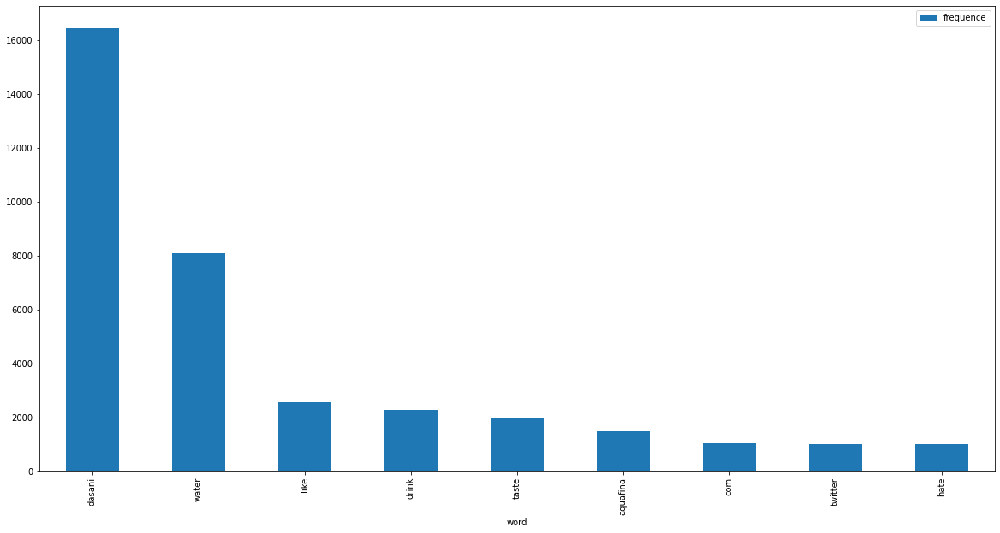

In [24]:
most_frequent_word1 = sorted_word_frequence1.loc[sorted_word_frequence1['frequence'] > 1000]
plt.rcParams['figure.figsize'] = [20, 10]
most_frequent_word1.plot.bar(x='word', y='frequence')


**Here, we can see that dasani, water, drink, like , hate and bootle are the most frequently occurring words for almost every sentence. This means that people are talking about dasani water and thier opinions about it .**

**another way to see the most frequent words is by using the wordcloud**
**A word cloud is an image made of words that together resemble a cloudy shape.**
**The size of a word shows how important it is or how often it appears in the text.** 

There are 968099 words in the combination of all review.


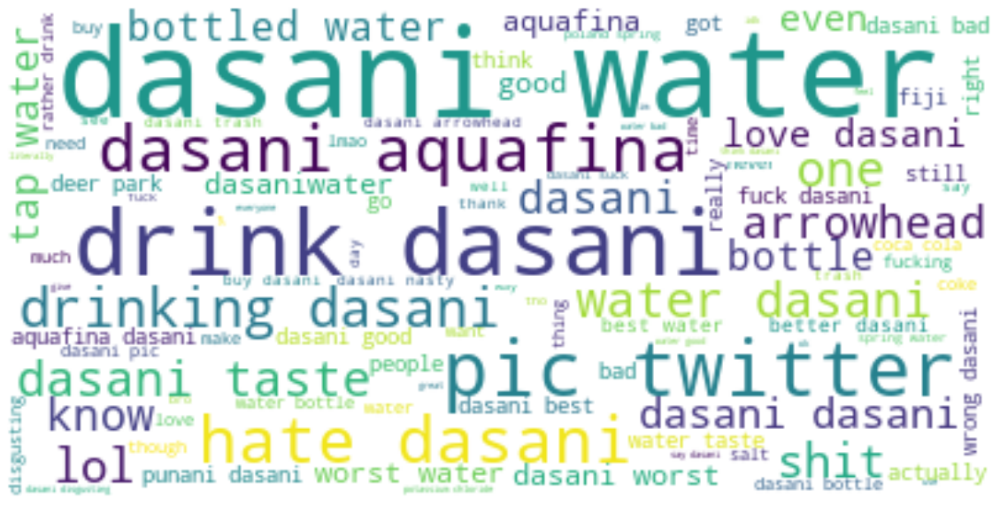

In [25]:
# Start with one review:
text  = " ".join(review for review in df_project.Text)
print ("There are {} words in the combination of all review.".format(len(text)))

# Create and generate a word cloud image:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)

# Display the generated image:
plt.rcParams['figure.figsize'] = [20, 20]
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# 2)- **Data_internship_test_anonymized**

## **Data Cleaning :**

In [50]:
df_anonymized = pd.read_excel('Data_internship_test_anonymized.xlsx')

**let's check if we have exactly 100 positive and 100 negative examples from the given annotation data set :**

In [51]:
df_anonymized.groupby(['Emotion']).count()

,ID,Original_verbatim
Emotion,,
negative,100,100
positive,100,100


In [52]:
# Renaming the 'Original_verbatim' column and set it to 'Text'
df_anonymized.rename(columns = {'Original_verbatim':'Text'}, inplace = True)

In [53]:
df_anonymized.head(10)

,ID,Text,Emotion
0,185629,Why is dasani bad,negative
1,185793,Can someone please tell me what's wrong with D...,negative
2,187237,Yall whats wrong with Dasani water? ????????????,negative
3,187268,Can someone explain why people hate dasani,negative
4,186967,omg the replies..... i didnt know dasani was s...,negative
5,187046,i am just now learning that the gp hates dasan...,negative
6,187413,Can someone explain to me what's the problem w...,negative
7,187497,I just figured out why people dont like dasani...,negative
8,187559,idk why dasani gets all that hate,negative
9,187690,As a water lover Dasani is the worst anything ...,negative


In [54]:
lemmatizer = WordNetLemmatizer()
corpus2 = []
for i in range(0, len(df_anonymized)):

    if df_anonymized['Emotion'][i] == "positive" or df_anonymized['Emotion'][i] == "negative":
        review2 = re.sub('[^a-zA-Z]', ' ', df_anonymized['Text'][i])
        review2 = review2.lower()
        review2 = review2.split()
        review2 = [lemmatizer.lemmatize(word) for word in review2 if not word in stopwords.words('english')]
        review2 = ' '.join(review2)
        corpus2.append(review2)

In [55]:
len(corpus2)

200

In [56]:
corpus2

['dasani bad',
 'someone please tell wrong dasani water whyme isittrue wow',
 'yall whats wrong dasani water',
 'someone explain people hate dasani',
 'omg reply didnt know dasani hated public',
 'learning gp hate dasani dang',
 'someone explain problem dasani water enlighten please',
 'figured people dont like dasani water',
 'idk dasani get hate',
 'water lover dasani worst anything else please',
 'nasty as dasani water',
 'everyone hate dasani',
 'really sure everyone hate dasani',
 'idk hate either never took time google search learn shem hate dasani though',
 'people really hate dasani understand',
 'mean choosing know people like dasani lol',
 'miss something everyone hating dasani tellmelikeitis dasani',
 'dasani water disgusting issatruthbombs dasaniwater',
 'lol know hate also dasani like bad bad lol',
 'get hate dasani like',
 'thing never knew people hated dasani lol',
 'aware everyone hate dasani',
 'lol people hating dasani',
 'wrong dasani water coronaviruspandemic',
 'wo

In [57]:
text_cleaned = pd.DataFrame(corpus2, columns=['Text'])

In [58]:
text_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    200 non-null    object
dtypes: object(1)
memory usage: 1.7+ KB


In [59]:
text_cleaned.isnull().sum().any()

False

**Let’s see if there are any null values present in our dataset:**

In [60]:
df_anonymized.isnull().sum()

ID          0
Text        0
Emotion    60
dtype: int64

**Drop rows which we did not assign any emotion :**

In [61]:
df_anonymized.dropna(axis=0,inplace=True)

In [62]:
df_anonymized.isnull().sum().any()

False

In [63]:
df_anonymized.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 0 to 258
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   ID       200 non-null    int64 
 1   Text     200 non-null    object
 2   Emotion  200 non-null    object
dtypes: int64(1), object(2)
memory usage: 6.2+ KB


**Drop the column 'Text' and 'ID' :**

In [64]:
df_anonymized.drop(['ID','Text'], axis =1, inplace= True)

In [65]:
df_anonymized.head()

,Emotion
0,negative
1,negative
2,negative
3,negative
4,negative


In [66]:
df_anonymized.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 0 to 258
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Emotion  200 non-null    object
dtypes: object(1)
memory usage: 3.1+ KB


## **Exploratory Data Analysis (EDA)**

### **Text length**

**The length of the samples in the dataset is very important, as it can affect how you represent your text as features for the ML models. For example, TF-IDF is usually too sparse for short texts and average Word2Vec is usually too noisy for long texts.**

count    200.000000
mean       5.465000
std        2.138138
min        2.000000
25%        4.000000
50%        5.000000
75%        6.000000
max       15.000000
Name: Text, dtype: float64


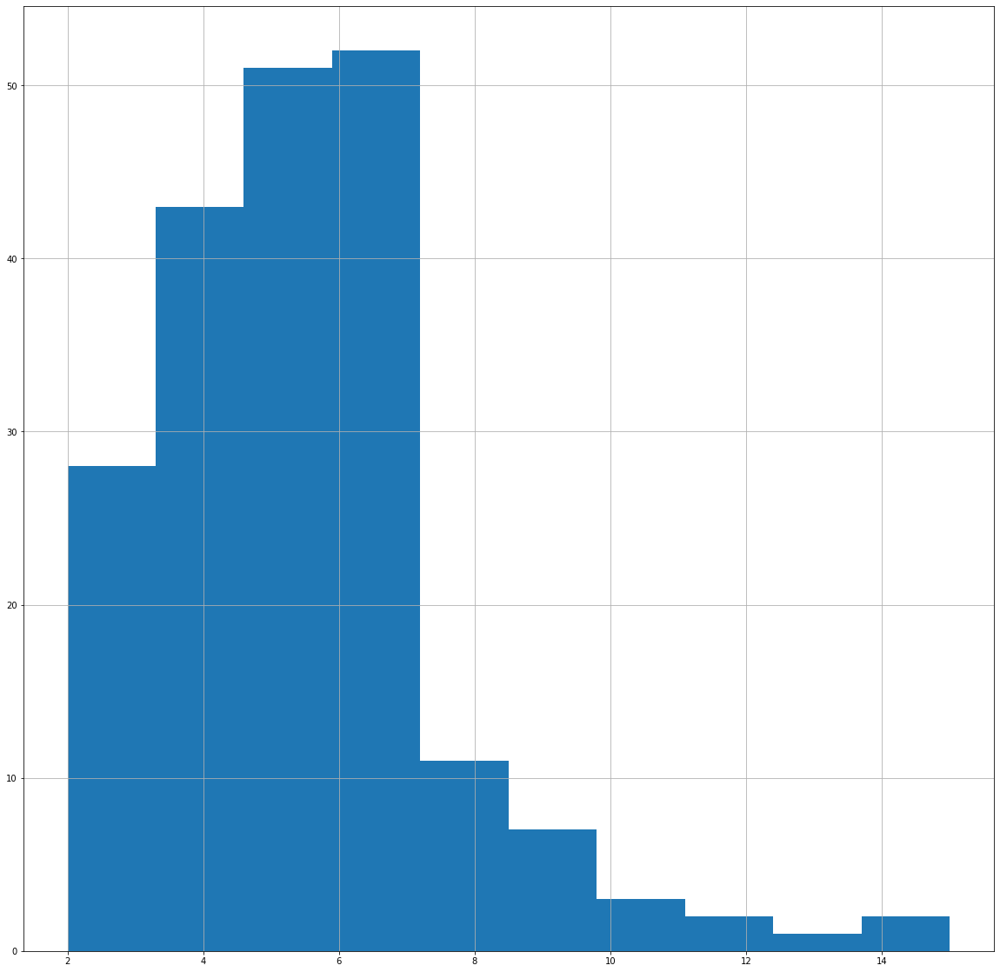

In [67]:
lens = text_cleaned['Text'].str.split().apply(lambda x: len(x))
print(lens.describe())
lens.hist()

**Results of this calculation establish that sentences length is short (average length of 5 words). And 75 % of sentences length is less than 6 words .**



### **Term frequencies**

**In this step, I find the most frequent words in the data, extracting information about its content .**

In [68]:
# Creating Document Term Matrix
cv2=CountVectorizer(analyzer='word')
data2=cv2.fit_transform(text_cleaned['Text'])
df_dtm2 = pd.DataFrame(data2.toarray(), columns=cv2.get_feature_names())
df_dtm2.index=text_cleaned['Text'].index
df_dtm2.head((50))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,accurate,actually,admit,afraid,allow,alone,also,always,answer,anybody,anyone,anything,artesian,as,asf,ask,avoid,aware,bad,bandwagon,bc,beginning,best,better,big,bitch,boarding,bonbee,bro,broken,bruh,bu,busy,buy,catch,cause,chest,chewy,choosing,collectively,...,though,thought,throughly,til,time,today,toiletpapercrisis,took,trending,triggered,trippin,truth,tryna,understand,understood,universal,url,vehemently,wait,walmart,water,waterv,way,weakkk,whats,whew,whyme,win,world,worse,worst,wow,wrong,wtf,www,ya,yall,yea,yes,youtu
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [69]:
my_dict2 = {"word":[],"frequence":[]};
for column in df_dtm2.columns :
  sum = df_dtm2[column].sum()
  my_dict2["word"].append(column)
  my_dict2["frequence"].append(sum)
   


In [70]:
word_frequence2 = pd.DataFrame(my_dict2)

In [71]:
sorted_word_frequence2 = word_frequence2.sort_values(by='frequence',ascending=False)
sorted_word_frequence2.head(50)

,word,frequence
51,dasani,203
280,water,102
111,hate,67
151,like,65
201,people,31
158,lol,19
75,everyone,19
195,one,18
292,wrong,16
146,know,16


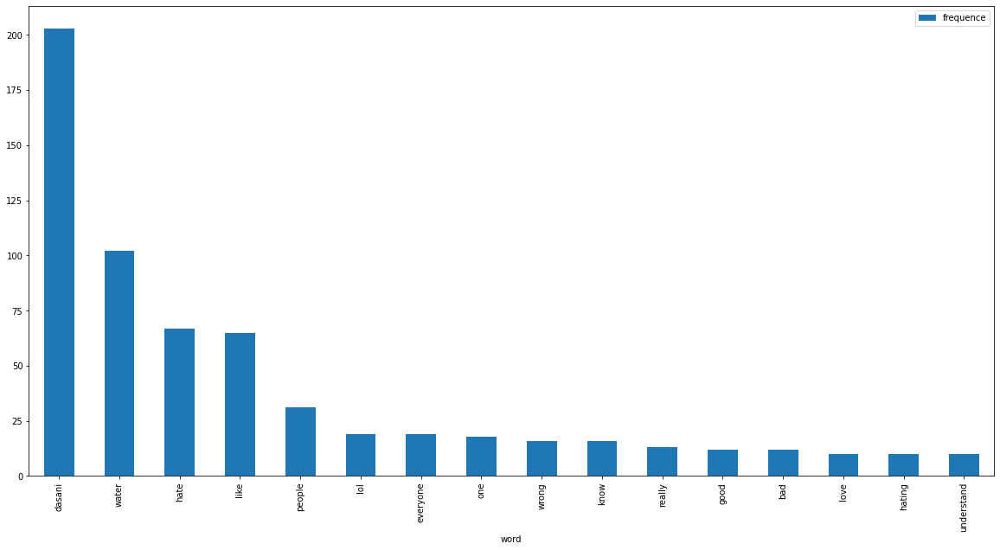

In [72]:
most_frequent_word2 = sorted_word_frequence2.loc[sorted_word_frequence2['frequence'] >= 10]
plt.rcParams['figure.figsize'] = [20, 10]
most_frequent_word2.plot.bar(x='word', y='frequence')


**Here, we can see that dasani, water, drink, like , hate and people are the most frequently occurring words for almost every sentence. This means that people are talking about dasani water and thier opinions about it .**

There are 6826 words in the combination of all review.


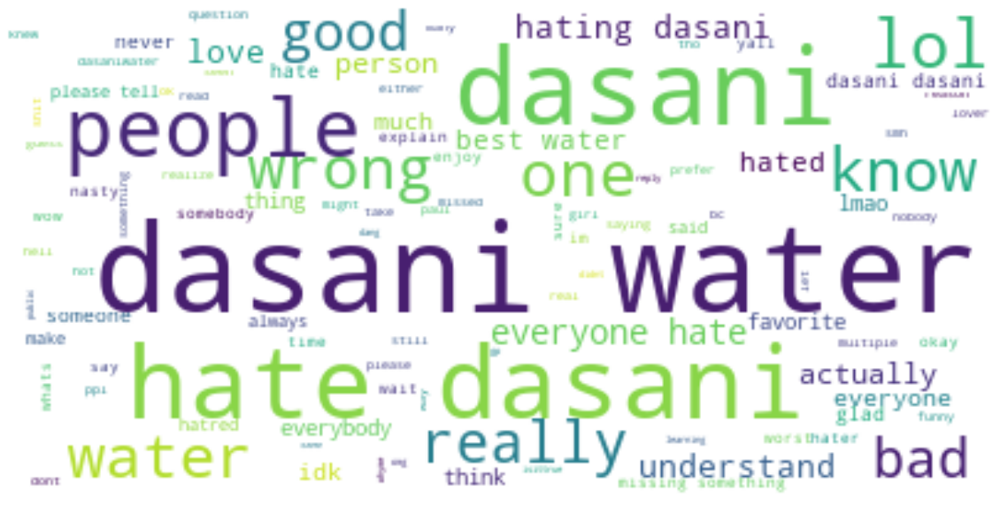

In [73]:
# Start with one review:
text  = " ".join(review for review in text_cleaned['Text'])
print ("There are {} words in the combination of all review.".format(len(text)))

# Create and generate a word cloud image:
wordcloud2 = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)

# Display the generated image:
plt.rcParams['figure.figsize'] = [20, 20]
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

# **3 - Machine Learning**

### after i have done the data analysis and explored my dataset, now the question that comes to mind is which model of machine learning to use or even deep learning model? 
### **what if i want to use a neural network ?**  The danger here  is overfitting the model because dataset is extremely small, so here i can use **Logistique Regression, k-Nearet Neighbour or Decision Tree.**
### I will use the three models and choose the one who will give me the best accuracy. 

### As we know, we need to represent our entities in a vector space in order to use our models. Since our entities are texts, we should use some feature extraction technique to extract feature vectors. For this demo, we’ll use bag of words. 

In [74]:
# Applying Countvectorizer
# Creating the Bag of Words model
cv = CountVectorizer()
X = cv.fit_transform(corpus2).toarray()

In [75]:
X.shape

(200, 300)

In [76]:
target_values={"positive":1,"negative":0}
df_anonymized['Emotion']= df_anonymized['Emotion'].map(target_values)

In [77]:
y=df_anonymized['Emotion']

In [78]:
X = pd.DataFrame(X)

**in StratifiedShuffleSplit the data is shuffled each time before the split is done and this is why there’s a greater chance that overlapping might be possible between train-test sets.**

In [79]:
sss= StratifiedShuffleSplit(n_splits=1, test_size=0.2,random_state=42)

for train,test in sss.split(X,y):
    x_train,x_test= X.iloc[train],X.iloc[test]
    y_train,y_test= y.iloc[train],y.iloc[test]

print('x_train taille:' , x_train.shape)
print('x_test taille:' , x_test.shape)
print('y_train taille:' , y_train.shape)
print('y_test taille:' , y_test.shape)

x_train taille: (160, 300)
x_test taille: (40, 300)
y_train taille: (160,)
y_test taille: (40,)


# 4)- **Application of Logistic Regression, KNN and DecisionTree algorithms**

**We often use accuracy when the classes are balanced and there is no major downside to predicting false negatives, here we have two balanced classes : 50 % of "negative" sentences and 50 % "positive" sentences**
**We often use F1 score when the classes are imbalanced and there is a serious downside to predicting false negatives, and not the case we have here .**

In [80]:
models={'LogisticRegression': LogisticRegression(random_state=42),
       'KNeighborsClassifier': KNeighborsClassifier(),
       'DecisionTreeClassifier': DecisionTreeClassifier(max_depth=1, random_state=42)
       }
# function of precision 
def accu(y_true,y_pred,retu=False):
    acc=accuracy_score(y_true,y_pred)
    print(f'The accuracy of the model is: {acc}')

#la fonction of application of the models

def train_test_eval(models,x_train,y_train,x_test,y_test):
    for name,model in models.items() :
        print(name,':')
        model.fit(x_train,y_train)
        accu(y_test,model.predict(x_test))
        print('-'*30)

train_test_eval(models,x_train,y_train,x_test,y_test)

LogisticRegression :
The accuracy of the model is: 0.9
------------------------------
KNeighborsClassifier :
The accuracy of the model is: 0.875
------------------------------
DecisionTreeClassifier :
The accuracy of the model is: 0.75
------------------------------


**As we can see the logistique has the greetest accuracy value, so i will use it to do my predictions :**

In [81]:
Classifier=LogisticRegression()
ml = Classifier.fit(x_train,y_train)

In [82]:
#acc = ml.score(x_test, y_test)
pred = ml.predict(x_test)
score = accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = confusion_matrix(y_test, pred)

accuracy:   0.900


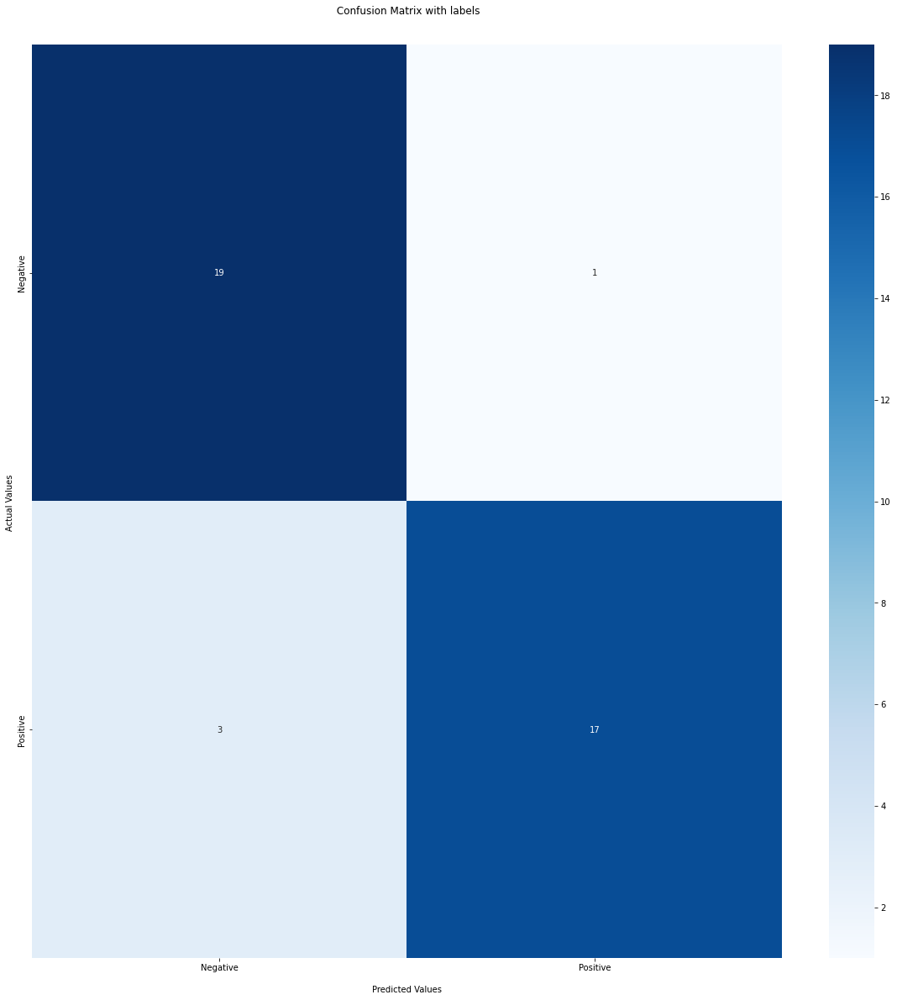

In [83]:
ax = sns.heatmap(cm, annot=True, cmap='Blues')

ax.set_title(' Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels 
ax.xaxis.set_ticklabels(['Negative','Positive'])
ax.yaxis.set_ticklabels(['Negative','Positive'])

## Display the visualization of the Confusion Matrix.
plt.show()



# 5)-

In [84]:
cv = CountVectorizer(max_features=300)

In [85]:
X1 = cv.fit_transform(corpus1).toarray()

In [86]:
X1.shape

(15837, 300)

In [87]:
X1 = pd.DataFrame(X1)

In [88]:
new_data = ml.predict(X1)

In [89]:
new_data = pd.DataFrame(new_data,columns = ['Emotion'])

In [90]:
target_values1={1:"positive",0:"negative"}
new_data['Emotion']= new_data['Emotion'].map(target_values1)

In [91]:
new_data

,Emotion
0,negative
1,negative
2,negative
3,negative
4,negative
...,...
15832,negative
15833,negative
15834,negative
15835,negative


In [92]:
new_data['Text'] = df_project['Text']

In [93]:
new_data.head()

,Emotion,Text
0,negative,highiqhaver nutsoutatdennys joshuarohnerd b oo...
1,negative,never intimidated bitch prefers drink dasani a...
2,negative,two coworkers said dasani taste bad think hire...
3,negative,baddgaljt nasty bout get cocky hell hate aquaf...
4,negative,ernstotv right easy dasani taste like shit


In [94]:
count_values = new_data.groupby(['Emotion']).count()
count_values

,Text
Emotion,
negative,15634
positive,203


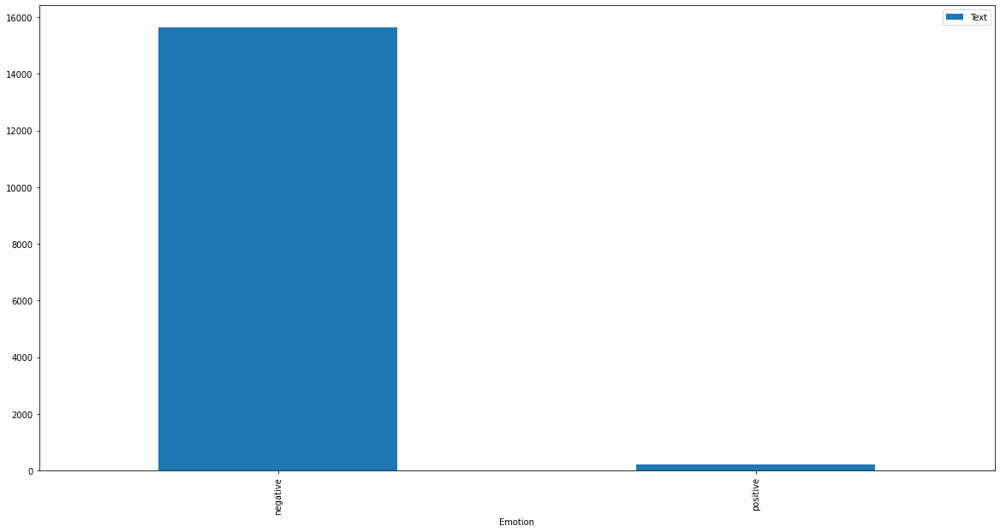

In [95]:
plt.rcParams['figure.figsize'] = [20, 10]
count_values.plot.bar()

# 6)-

**As we can see above most of the sentences are predicted to be negative. And just a few number of sentences is predicted to be positive, so let's check some examples :**

In [96]:
pd.options.display.max_rows = None

In [97]:
positive_data= new_data[new_data['Emotion']=='positive']

In [98]:
negative_data= new_data[new_data['Emotion']=='negative']

In [99]:
positive_data.head(50)

,Emotion,Text
21,positive,gaberjimz dasani disgusting thing ever exist p...
96,positive,rather drink piss drink fucking dasani
130,positive,coca cola product honest tea variety flavor se...
223,positive,la croix nothing dasani sparkling period good ...
652,positive,rather drink piss drink dasani least kno piss ...
699,positive,rather drink piss drink dasani pic twitter com...
909,positive,funny dasani v aquafina argument still water e...
1058,positive,realjuliasong dasani probably worst analysis
1583,positive,finallybad enough people bought dasani pic twi...
1607,positive,actually flavor magnesium sulfate think salt o...


In [100]:
new_data.iloc[96]

Emotion                                  positive
Text       rather drink piss drink fucking dasani
Name: 96, dtype: object

In [101]:
new_data.iloc[6050]

Emotion               positive
Text       dasani worst flavor
Name: 6050, dtype: object

In [102]:
new_data.iloc[7183]

Emotion                                   positive
Text       think dasani taste fine good even fight
Name: 7183, dtype: object

In [103]:
new_data.iloc[3733]

Emotion                                        positive
Text       punani dasani probably one favorite line wap
Name: 3733, dtype: object

### As we can see in the examples above, our model predict some sentences to be positive and it get them right but it predict most of the sentences wrong :

In [104]:
negative_data.head(100)

,Emotion,Text
0,negative,highiqhaver nutsoutatdennys joshuarohnerd b oo...
1,negative,never intimidated bitch prefers drink dasani a...
2,negative,two coworkers said dasani taste bad think hire...
3,negative,baddgaljt nasty bout get cocky hell hate aquaf...
4,negative,ernstotv right easy dasani taste like shit
5,negative,ernstotv yo everyone hatin dasani dasani hitti...
6,negative,emfles dasani worst case
7,negative,dasani bottle really enjoy good call
8,negative,dasani water really best water argue
9,negative,ph drinking water approximately blood anything...


In [105]:
new_data.iloc[25]

Emotion                   negative
Text       dasani good water drink
Name: 25, dtype: object

In [106]:
new_data.iloc[26]

Emotion                  negative
Text       dasani water nasty asf
Name: 26, dtype: object

In [107]:
new_data.iloc[24]

Emotion                                 negative
Text       hot take dasani taste like pool water
Name: 24, dtype: object

In [108]:
new_data.iloc[20]

Emotion                         negative
Text       wonder dasani taste like shit
Name: 20, dtype: object

### As we can see in the examples above, our model predict  sentences to be negative and it get them wrong and  it predict most of the sentences right 

# 7)-

## An amprovement that we can do is to have a large dataset so our model will learn more and get better accuracy, and so we can apply neural networks alrorithms, Word Embeddings (word2vec) and Deep Network like LSTM or CNN without resking to overfit our data .

In [109]:
new_data

,Emotion,Text
0,negative,highiqhaver nutsoutatdennys joshuarohnerd b oo...
1,negative,never intimidated bitch prefers drink dasani a...
2,negative,two coworkers said dasani taste bad think hire...
3,negative,baddgaljt nasty bout get cocky hell hate aquaf...
4,negative,ernstotv right easy dasani taste like shit
5,negative,ernstotv yo everyone hatin dasani dasani hitti...
6,negative,emfles dasani worst case
7,negative,dasani bottle really enjoy good call
8,negative,dasani water really best water argue
9,negative,ph drinking water approximately blood anything...


In [122]:
projection_results = new_data.to_excel(r'projection_results.xlsx')

In [123]:
files.download('projection_results.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>